In [7]:
import os
import pandas as pd
import re
from collections import defaultdict

# === CONFIGURATION ===
input_folder = 'cleanedFiles'
output_folder = 'unlinked_connections3'
os.makedirs(output_folder, exist_ok=True)

# === STEP 1: Get existing filenames ===
existing_files = set()
for file in os.listdir(input_folder):
    if file.endswith(".csv"):
        name = os.path.splitext(file)[0].strip()
        existing_files.add(name)

# === STEP 2: Build who-mentioned-whom map ===
mention_map = defaultdict(list)  # { "John Doe": [("Alice", "Smith"), ...] }

for file in os.listdir(input_folder):
    if not file.endswith(".csv"):
        continue

    file_path = os.path.join(input_folder, file)
    df = pd.read_csv(file_path)

    student_name = os.path.splitext(file)[0].strip()
    name_parts = student_name.split(maxsplit=1)
    first_name = name_parts[0]
    last_name = name_parts[1] if len(name_parts) > 1 else ""

    for _, row in df.iterrows():
        first = str(row.get("First Name", "")).strip()
        last = str(row.get("Last Name", "")).strip()

        # If either first or last exists, consider it
        if first or last:
            mentioned_name = f"{first} {last}".strip()
            mention_map[mentioned_name].append((first_name, last_name))

# === STEP 3: Create unlinked files for mentioned names not having their own file ===
print("📄 Generating unlinked connection files...\n")

for mentioned_name, referring_students in mention_map.items():
    if mentioned_name not in existing_files:
        safe_filename = re.sub(r'[\\/*?:"<>|]', "", mentioned_name)  # clean up filename
        output_path = os.path.join(output_folder, f"{safe_filename}.csv")
        df_out = pd.DataFrame(referring_students, columns=["First Name", "Last Name"])
        df_out["Company"] = ""  # Add empty Company column
        df_out.to_csv(output_path, index=False)
        print(f"✅ Generated: {safe_filename}.csv")

print(f"\n🎉 All unlinked connections saved in: {output_folder}")


📄 Generating unlinked connection files...

✅ Generated: Harsh Kumar Singh.csv
✅ Generated: Saurabh Singh.csv
✅ Generated: Hariom Parmar.csv
✅ Generated: Sukhe nan.csv
✅ Generated: Mani Kumar.csv
✅ Generated: Mudasir Ahmad.csv
✅ Generated: Ayush Katiyar.csv
✅ Generated: Radhika Pal.csv
✅ Generated: Punam Mandal.csv
✅ Generated: Prakash Behera.csv
✅ Generated: Nikita Paikara.csv
✅ Generated: Mohammad Zaid.csv
✅ Generated: Rudraksh Namdeo.csv
✅ Generated: Ankit Kumar.csv
✅ Generated: Aakash Kumar.csv
✅ Generated: Amrita Yadav.csv
✅ Generated: Adityansh Chand.csv
✅ Generated: Mohd Shadab Ansari.csv
✅ Generated: Rohit Pingale.csv
✅ Generated: Amit Diwakar.csv
✅ Generated: Siddharth Sahani.csv
✅ Generated: Hrishikesh Dixit.csv
✅ Generated: Divyanshu Fartiyal.csv
✅ Generated: Rudra Pratap Singh Chauhan.csv
✅ Generated: Abhinav Mishra.csv
✅ Generated: Vishal Dhaniya.csv
✅ Generated: Amrita Kumari.csv
✅ Generated: Chhaya Pawar.csv
✅ Generated: Shivani Parashwar.csv
✅ Generated: Nishant Rasekar.

In [ ]:
import os

# Specify the folder path
folder_path = r'D:\SEM_2\MFC\graphAssignment\totalFiles'

# Count files (not directories) in the folder
file_count = sum(1 for entry in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, entry)))

print(f"📁 Total number of files in '{folder_path}': {file_count}")

📁 Total number of files in 'D:\SEM_2\MFC\graphAssignment\totalFiles': 28474


In [11]:
import os

# Path to your folder containing the graph files
folder_path = "totalFiles"
degreeList={}
print("Degree of each node:\n")
for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)

    # Make sure it's a file (not a folder)
    if os.path.isfile(file_path):
        with open(file_path, 'r') as f:
            # Count non-empty lines as degree
            degree = sum(1 for line in f if line.strip())
            print(f"{filename}: Degree = {degree}")
            degreeList[filename]=degree



Degree of each node:

A   K M.csv: Degree = 2
A  K Singh.csv: Degree = 2
A D S David Babu.csv: Degree = 2
A Dilli Prasad.csv: Degree = 2
A K Saini Phd.csv: Degree = 2
A Moksha Sulif.csv: Degree = 2
A Nandhan.csv: Degree = 2
Aabha Shukla.csv: Degree = 2
Aabhash Mukherjee.csv: Degree = 3
Aabir Mukhopadhyay.csv: Degree = 3
Aachal Bansod.csv: Degree = 2
Aachal Sharma.csv: Degree = 2
Aadarsh Armil.csv: Degree = 2
Aadarsh Gupta.csv: Degree = 2
Aadarsh Kumar Nirmal.csv: Degree = 2
Aadarsh Kumar.csv: Degree = 5
Aadarsh Negi.csv: Degree = 3
Aadarsh Ranjan.csv: Degree = 3
Aadarsh S.csv: Degree = 2
Aadarsh Singh.csv: Degree = 4
Aadarsh Sridhar.csv: Degree = 2
Aadesh Alawe.csv: Degree = 4
Aadesh Bishnoi.csv: Degree = 5
Aadesh Kumar.csv: Degree = 3
Aadi Aarya Chandra.csv: Degree = 3
Aadi Bhat.csv: Degree = 5
Aadi Chandra.csv: Degree = 21
Aadi Jain.csv: Degree = 4
Aadi Malhotra.csv: Degree = 13
Aadi Pandey.csv: Degree = 3
Aadi Shrivastava.csv: Degree = 2
Aadi Srivastava.csv: Degree = 3
Aadil Mugal.c

In [12]:
import os
import csv
import json

def build_adjacency_list_from_csv(folder_path):
    adjacency_list = {}

    for filename in os.listdir(folder_path):
        if filename.endswith(".csv"):
            main_node = filename.replace("_", " ").replace(".csv", "")
            neighbors = []

            file_path = os.path.join(folder_path, filename)
            with open(file_path, newline='', encoding='utf-8') as csvfile:
                reader = csv.DictReader(csvfile)
                for row in reader:
                    first = row.get("First Name", "").strip()
                    last = row.get("Last Name", "").strip()
                    if first and last:
                        neighbors.append(f"{first} {last}")

            adjacency_list[main_node] = neighbors

    return adjacency_list

# Example usage
folder_path = r"D:\SEM_2\MFC\graphAssignment\totalFiles"
adj_list = build_adjacency_list_from_csv(folder_path)
print(json.dumps(adj_list, indent=2))


{
  "A   K M": [
    "Gaurav Rathore"
  ],
  "A  K Singh": [
    "Ramraj Nagar"
  ],
  "A D S David Babu": [
    "Ayush Kumar"
  ],
  "A Dilli Prasad": [
    "Yuvraj Chirag"
  ],
  "A K Saini Phd": [
    "Neeraj Parmar"
  ],
  "A Moksha Sulif": [
    "Pranjal Dubey"
  ],
  "A Nandhan": [
    "Byagari Kumar"
  ],
  "Aabha Shukla": [
    "Prabhat Patidar"
  ],
  "Aabhash Mukherjee": [
    "Himanshu Kumar",
    "Rohit Malviya"
  ],
  "Aabir Mukhopadhyay": [
    "Anamika Kumari",
    "Ekta Kumari"
  ],
  "Aachal Bansod": [
    "Manoj Kharkar"
  ],
  "Aachal Sharma": [
    "Divyanshi Sahu"
  ],
  "Aadarsh Armil": [
    "Alok Raj"
  ],
  "Aadarsh Gupta": [
    "Manoj Kharkar"
  ],
  "Aadarsh Kumar Nirmal": [
    "Shilpi Shaw"
  ],
  "Aadarsh Kumar": [
    "Ekta Kumari",
    "Gaurav Rathore",
    "Pawan Kushwah",
    "Rahul Verma"
  ],
  "Aadarsh Negi": [
    "Aman Singh",
    "Aryan Saini"
  ],
  "Aadarsh Ranjan": [
    "Manoj Dewda",
    "Nirmal Mewada"
  ],
  "Aadarsh S": [
    "Ravi Rajpu

In [15]:
import random

def random_walk(adjacency_list, start_node, end_node, max_steps=1000):
    if start_node not in adjacency_list or end_node not in adjacency_list:
        raise ValueError("Start or end node not in the graph")

    current = start_node
    path = [current]

    for _ in range(max_steps):
        neighbors = adjacency_list.get(current, [])
        if not neighbors:
            break  # dead end

        next_node = random.choice(neighbors)
        path.append(next_node)

        if next_node == end_node:
            return path  # success!

        current = next_node

    return None  # failed to reach end node in max_steps


In [16]:
start = "Arpita Tripathi"
end = "Anamika Kumari"

path = random_walk(adj_list, start, end)
if path:
    print("Random Walk Path:", " → ".join(path))
else:
    print("Could not reach the end node within max steps.")

Random Walk Path: Arpita Tripathi → Sauhard Kumar → Anshul Sharma → Pawan Kushwah → Deependra Shukla → Shubham Kang → Sourabh Kumar → Jamal Akhtar → Nagendra Singh → Vinay Kumar → Priyanka Shrivastav → Vinay Kumar → Saurabh Agrahari → Bhaskar Mahato → Aakash Deep → Chandan Giri → Pranay Gupta → Rohit Malviya → Sahil Kumar Sah → Manish Kumar Tiwari → Ayush Yadav → Raju Sahis → Rajiv Kumar → Prince Anand → Chandan Giri → Pritam Mandal → Aman Singh → Sneha Rani → Ayush Kumar → Gajendra Singh Gurjar → Ayush Kumar → Ishitaa Saxena → Nirmal Mewada → Akshay Sharma → Nirmal Mewada → Sagar Kumar → Priyadarshi Kumar → Shipra Singh → Bhagwati No-Lastname → Amit Kumar → Guman Singh → Debangsu Misra → Hrisheek Paritala → Rohit Malviya → Ashish Sharma → Prabhat Patidar → Bhavesh Gehlot → Prabhat Patidar → Pawan Kumar Tiwari → Prabhat Patidar → Babedhnego Abhi → Vivek Kumar → Pooja Mahawar → Nirmal Mewada → Virendra Patel → Shubham Kang → Ganesh Vasuniya → Shubham Kumar → Satyam Jha → Shubham Kumar →

In [17]:
def prone_path(adjacency_list, start_node, end_node, visited=None, path=None):
    if visited is None:
        visited = set()
    if path is None:
        path = []

    visited.add(start_node)
    path.append(start_node)

    if start_node == end_node:
        return path

    for neighbor in adjacency_list.get(start_node, []):
        if neighbor not in visited:
            result = prone_path(adjacency_list, neighbor, end_node, visited, path)
            if result:
                return result

    path.pop()          # Backtrack
    visited.remove(start_node)
    return None         # No path found


prone_path(adj_list,start,end)

['Arpita Tripathi', 'Sonika Thakral', 'Anamika Kumari']

In [18]:
def generate_multiple_random_walks(adjacency_list, start_node, end_node, num_walks=100, max_steps=1000):
    walks = []
    for _ in range(num_walks):
        walk = random_walk(adjacency_list, start_node, end_node, max_steps)
        if walk is not None:
            walks.append(walk)
    return walks


In [19]:
generate_multiple_random_walks(adj_list,'Arpita Tripathi', 'Shilpi Shaw')

[['Arpita Tripathi',
  'Rakshita K Biradar',
  'Ekta Kumari',
  'Laxmikant Malav',
  'Anamika Kumari',
  'Jitendra Kumar',
  'Mehtab Alam',
  'Sahil Kumar',
  'Aaditya Raj',
  'Nalini Agarwal',
  'Aaditya Raj',
  'Ram Bhanwar Bhadiyar',
  'Swati Kumari',
  'Himanshu Pandey',
  'Aman Singh',
  'Mahdihusain Momin',
  'Aryan Saini',
  'Sachin Gaond',
  'Aryan Saini',
  'Veeresh Hiremath',
  'Rohit Malviya',
  'Anurag Mandal',
  'Ujjval Baijal',
  'Saksham Chhabra',
  'Ujjval Baijal',
  'Asad Alam',
  'Shivang Dubey',
  'Harsh Bhati',
  'Divyanshi Sahu',
  'Manish Dhaygude',
  'Divyanshi Sahu',
  'Garima Singh',
  'Pranjal Dubey',
  'Sharvatosh Pandey',
  'Pranjal Dubey',
  'Karan Medhi',
  'Pranjal Dubey',
  'Chandrasen Pandey',
  'Pranjal Dubey',
  'Mayank Singh Tomar',
  'Byagari Kumar',
  'Bhaman Yadav Singh',
  'Mohit Sharma',
  'Roshan Gupta',
  'Anshu Kumar',
  'Sanjay V P',
  'Anand Pandey',
  'Kaushiki Jaiswal',
  'Shubham Kumar',
  'Umesh Mishra',
  'Mohit Sharma',
  'Jagriti Pan

In [20]:
walks = generate_multiple_random_walks(adj_list, "Arpita Tripathi", "Shilpi Shaw", num_walks=20)
print(f"Found {len(walks)} successful walks from {start} to {end}.\n")

# Print first 5 walks
for i, walk in enumerate(walks[:5]):
    print(f"Walk {i+1}: {walk} (Length: {len(walk)})")

Found 16 successful walks from Arpita Tripathi to Anamika Kumari.

Walk 1: ['Arpita Tripathi', 'Rahul Chauhan', 'Aman Adarsh', 'Tejeshwar Jnv', 'Rohit Kumar', 'Avinash Kumar', 'Aryan Saini', 'Uttam Kumar', 'Rajiv Kumar', 'Pragya Singh', 'Ishant Bhoyar', 'Anuj Kumar', 'Ekta Kumari', 'Srijan Das', 'Ekta Kumari', 'Prakash S Rathod', 'Challa Trivedh Kumar', 'Azad Babu', 'Himanshu Srivastav', 'Yuvraj Chirag', 'Prakash Behera', 'Bhagwan Singh Rawat', 'Ravindra Baghel', 'Bhagwan Singh Rawat', 'Satyam Kumar Pandey', 'Anoop Kumar', 'Vivek Singh', 'Anamika Kumari', 'Amit Raj', 'Prem Kumar', 'Vighnraj Gurjar', 'Prem Kumar', 'Disha Sahu', 'Anurag Yadav', 'Ujjval Baijal', 'Utsav Patel', 'Ujjval Baijal', 'Ojas Bhalerao', 'Ujjval Baijal', 'Omkar Singh', 'Ujjval Baijal', 'Ambuj Verma', 'Ujjval Baijal', 'Gunashekar Chenna', 'Ujjval Baijal', 'Smurti Akash Jena', 'Aman Singh', 'Aayush Pal', 'Alok Raj', 'Mohd Alam', 'Pranjal Dubey', 'Anushka Bhatnagar', 'Pranjal Dubey', 'Anurag Niraj', 'Challa Trivedh Kum

In [21]:
def prune_walk(walk):
    seen = set()
    pruned = []
    for node in walk:
        if node in seen:
            continue
        pruned.append(node)
        seen.add(node)
    return pruned


In [22]:
# Assuming w1 is a list of walks like: [[walk1], [walk2], ..., [walkN]]
w1=generate_multiple_random_walks(adj_list,'Arpita Tripathi', 'Shilpi Shaw')
pruned_walks = [prune_walk(walk) for walk in w1]
print (pruned_walks)

[['Arpita Tripathi', 'Abhimanyu Kumar', 'Himanshu Kumar', 'Nitish Kumar Gautam', 'Challa Trivedh Kumar', 'Sumit Kumar Singh', 'Prachi Dhakad', 'Jatin Deep Singh', 'Manoj Dewda', 'Swaroop Chintada', 'Navya Velpuru', 'Achint Kumar Kansal', 'Ayush Bulbule', 'Shivansh Srivastav', 'Byagari Kumar', 'Kollamuri Rajesh', 'Anupam Vyas', 'Richa Sharma', 'Mithilesh Maurya', 'Pragati Chauhan', 'Riya Gupta', 'Yuvraj Chirag', 'Ritesh Kumar Yadav', 'Aryan Saini', 'Suraj Prajapati', 'Dilip Suthar', 'Monu Rajpoot', 'Goutam Deewan', 'Manish Kumar Tiwari', 'Suresh Kumar', 'Shubham Kumar', 'Chanchal Kumar', 'Samsher Kumar', 'Sandhya Parmar', 'Ayush Kumar', 'Vansh Goel', 'Vishal Mathur', 'Bhaskar Mahato', 'Madhu Keshari', 'Anadi Mehta', 'Aman Singh', 'Saurabh Jha', 'Manoj Kharkar', 'Yash Chittora', 'Akshat Tewari', 'Lakhan Rathore', 'Ayush Parmar', 'Abhishek Parmar', 'Ompal Yadav', 'Swarnali Saha', 'Abhay Pratap Singh Senger', 'Ajay Jatav', 'Aditya Singh', 'Vishal Kumar', 'Soumya Prakash Biswal', 'Ishant Bh

In [23]:
prunelen=[]
randomlen=[]
for i, walk in enumerate(w1):
    pruned = prune_walk(walk)
    print(f"Original Walk {i+1}: {walk}")
    randomlen.append(len(walk))
    print(f"  Original Walk Length: {len(walk)}")
    print(f"Pruned   Path {i+1}: {pruned}")
    prunelen.append(len(pruned))
    print(f"  Pruned   Path Length: {len(pruned)}")


Original Walk 1: ['Arpita Tripathi', 'Abhimanyu Kumar', 'Himanshu Kumar', 'Nitish Kumar Gautam', 'Challa Trivedh Kumar', 'Sumit Kumar Singh', 'Prachi Dhakad', 'Jatin Deep Singh', 'Manoj Dewda', 'Swaroop Chintada', 'Manoj Dewda', 'Navya Velpuru', 'Manoj Dewda', 'Achint Kumar Kansal', 'Manoj Dewda', 'Ayush Bulbule', 'Manoj Dewda', 'Shivansh Srivastav', 'Byagari Kumar', 'Kollamuri Rajesh', 'Byagari Kumar', 'Anupam Vyas', 'Byagari Kumar', 'Richa Sharma', 'Byagari Kumar', 'Mithilesh Maurya', 'Pragati Chauhan', 'Riya Gupta', 'Yuvraj Chirag', 'Ritesh Kumar Yadav', 'Aryan Saini', 'Suraj Prajapati', 'Dilip Suthar', 'Monu Rajpoot', 'Goutam Deewan', 'Manish Kumar Tiwari', 'Suresh Kumar', 'Shubham Kumar', 'Chanchal Kumar', 'Shubham Kumar', 'Samsher Kumar', 'Sandhya Parmar', 'Ayush Kumar', 'Vansh Goel', 'Himanshu Kumar', 'Vishal Mathur', 'Bhaskar Mahato', 'Madhu Keshari', 'Bhaskar Mahato', 'Anadi Mehta', 'Aman Singh', 'Saurabh Jha', 'Manoj Kharkar', 'Yash Chittora', 'Yuvraj Chirag', 'Akshat Tewari'

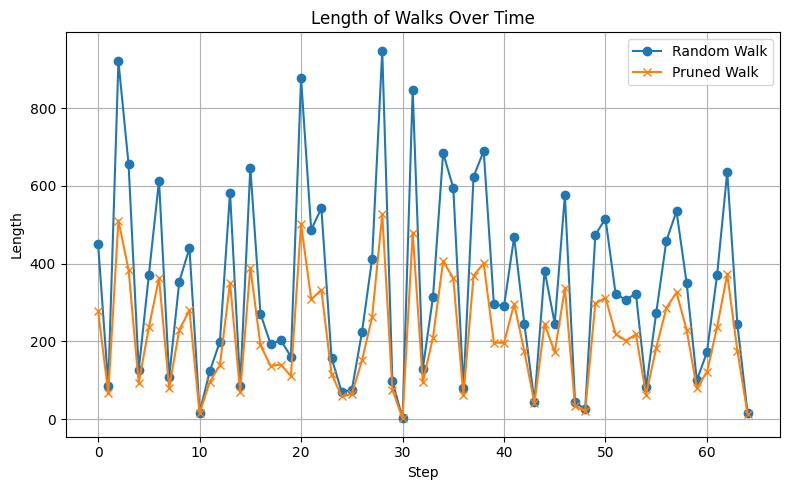

In [24]:
import matplotlib.pyplot as plt


# Generate x-axis values (e.g., step indices)
steps = list(range(len(randomlen)))

# Plotting
plt.figure(figsize=(8, 5))

plt.plot(steps, randomlen, label='Random Walk', marker='o')
plt.plot(steps, prunelen, label='Pruned Walk', marker='x')

plt.title('Length of Walks Over Time')
plt.xlabel('Step')
plt.ylabel('Length')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
def compute_statistics(walks):
    lengths = [len(walk) for walk in walks]
    if not lengths:
        return {
            "count": 0,
            "min": None,
            "max": None,
            "avg": None
        }
    return {
        "count": len(lengths),
        "min": min(lengths),
        "max": max(lengths),
        "avg": sum(lengths) / len(lengths)
    }

compute_statistics(w1)

{'count': 79, 'min': 2, 'max': 992, 'avg': 351.1645569620253}

In [ ]:
import os
import pandas as pd

# Directory where the LinkedIn dataset files are located
directory = r"D:\SEM_2\MFC\graphAssignment\totalFiles"

# Initialize counter for files with one row
one_row_files = 0

# Iterate through files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):  # assuming CSV files
        file_path = os.path.join(directory, filename)
        # Read the CSV file
        df = pd.read_csv(file_path)
        # Check if the number of rows is 1
        if len(df) == 1:
            one_row_files += 1

# Print the result
print(f"Number of files with only one row: {one_row_files}")


Number of files with only one row: 17680


Matplotlib is building the font cache; this may take a moment.


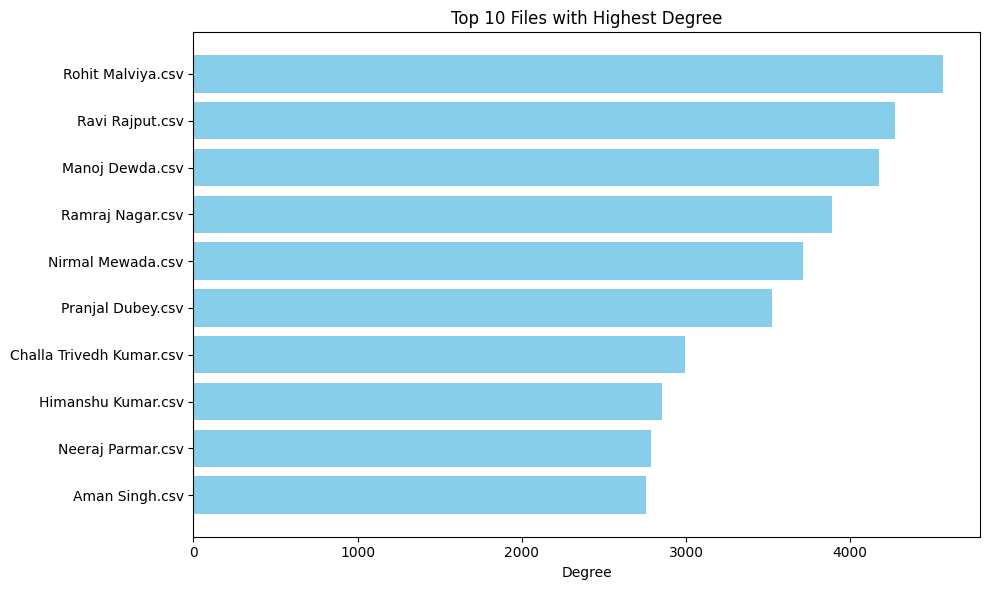

In [ ]:
import matplotlib.pyplot as plt

# Example: your existing dictionary
# degree_dict = {
#     "file1.csv": 10,
#     "file2.csv": 25,
#     ...
# }

# Get top 10 filenames with highest degree
top_10 = sorted(degreeList.items(), key=lambda x: x[1], reverse=True)[:10]

# Split into filenames and degrees
filenames, degrees = zip(*top_10)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(filenames[::-1], degrees[::-1], color='skyblue')  # reverse to show highest on top
plt.xlabel('Degree')
plt.title('Top 10 Files with Highest Degree')
plt.tight_layout()
plt.show()


Average (excluding solos, companies with 2 members, and companies with 28,480 members): 15.49

Top and Small Companies (excluding Solos, companies with 2 members, and companies with 28,480 members):
                                 Company  Count Category
1                                Hcltech   1199    Large
2                      Sitare University   1197    Large
3                                 Google    615    Large
4                                 Amazon    525    Large
5                    Dakshana Foundation    506    Large
...                                  ...    ...      ...
3639                  Sopra Steria India      3    Small
3640                              Eduglx      3    Small
3641                   Drop Organization      3    Small
3642     Akums Drugs Pharmaceuticals Ltd      3    Small
3643  Plat Exam Pvt Ltd Physicsloveraman      3    Small

[3643 rows x 3 columns]


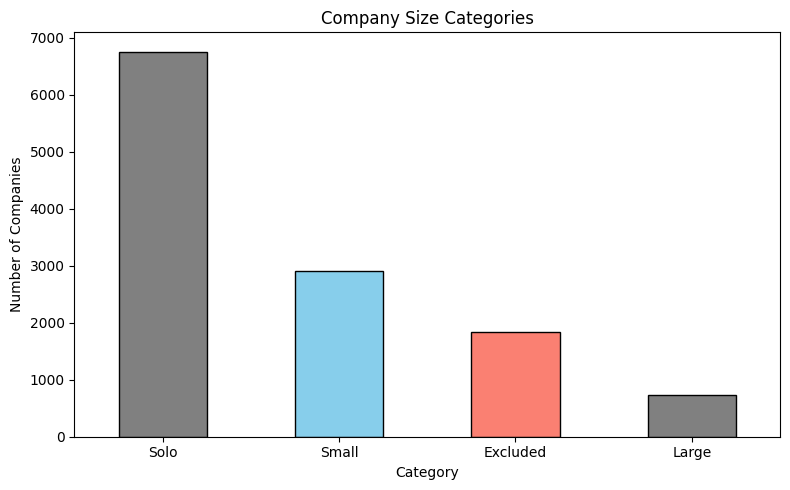

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Create a new dataframe by dropping rows where 'Company' is NaN
df_no_null = df_all.dropna(subset=['Company'])

# Step 2: Count number of people per company in the new dataframe
company_counts = df_no_null['Company'].value_counts()
company_df = company_counts.reset_index()
company_df.columns = ['Company', 'Count']

# Step 3: Exclude solo companies, companies with exactly 2 members, and companies with 28,480 members
non_solo_or_two_or_large = company_df[(company_df['Count'] > 2) & (company_df['Count'] != 28480)]
average_count = non_solo_or_two_or_large['Count'].mean()
print(f"Average (excluding solos, companies with 2 members, and companies with 28,480 members): {average_count:.2f}")

# Step 4: Categorize companies
def categorize(count):
    if count == 1:
        return 'Solo'
    elif count == 2:
        return 'Excluded'  # To exclude companies with 2 members
    elif count == 28480:
        return 'Excluded'  # To exclude companies with 28,480 members
    elif count >= average_count:
        return 'Large'
    else:
        return 'Small'

company_df['Category'] = company_df['Count'].apply(categorize)

# Step 5: Filter out solo companies, companies with exactly 2 members, and companies with 28,480 members, 
# and get top and small companies
top_companies = company_df[(company_df['Category'] == 'Large') | (company_df['Category'] == 'Small')]

# Step 6: Show only top and small companies with number of members
top_companies = top_companies[['Company', 'Count', 'Category']]
print("\nTop and Small Companies (excluding Solos, companies with 2 members, and companies with 28,480 members):")
print(top_companies)

# Step 7: Plot company category distribution
category_counts = company_df['Category'].value_counts()

plt.figure(figsize=(8, 5))
category_counts.plot(kind='bar', color=['gray', 'skyblue', 'salmon'], edgecolor='black')
plt.title('Company Size Categories')
plt.xlabel('Category')
plt.ylabel('Number of Companies')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


### Avoid that top first because it is NAN column=Empty column. 

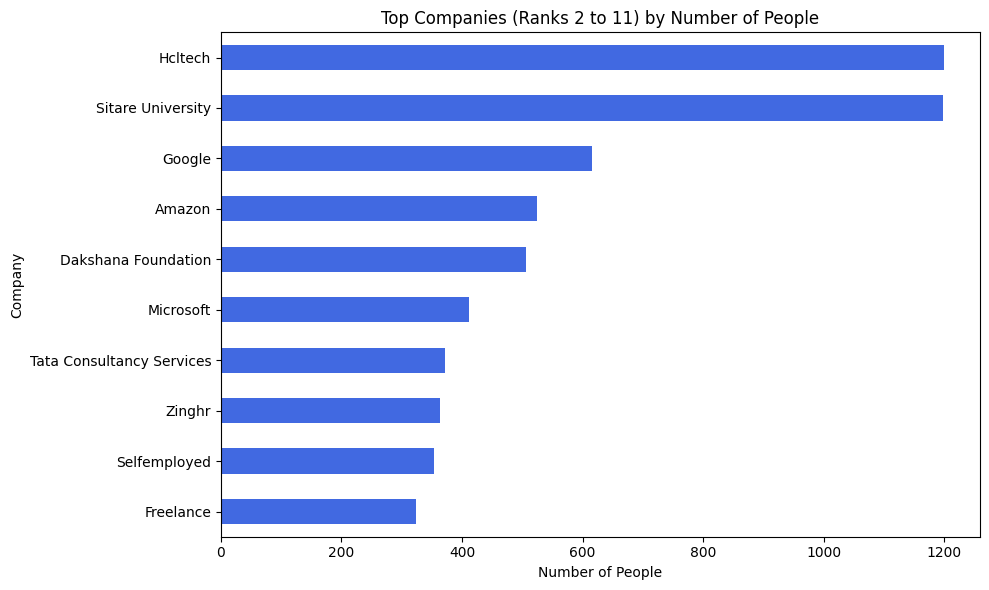


📌 Company: Hcltech (1199 people)
 - Adityansh Chand
 - Divyanshu Fartiyal
 - Sarthak Shukla
 - Yash Singh
 - Gaurav Kumar
 - Krishna Srivastava
 - Satyam Kumar
 - Ashray Deep Bajpai
 - Raima Jash
 - Devansh Tiwari
 - Jagmohan Mehta
 - Rifaat Husain
 - Shashwat Sahu
 - Vikas Gupta
 - Sarthak Shukla
 - Mohammad Nadeem
 - Gautam Deshwal
 - Rajeev Ranjan
 - Abu Sahil Akhtar
 - Rishabh Jain
 - Jatin Kumar
 - Aditya Singh Tomar
 - Kushagra Misra
 - Shivam Kumar
 - Jai Pratap Mishra
 - Sarthak Shukla
 - Amit Kumar
 - Kunal Malakar
 - Vinay Sharma
 - Vineet Kumar
 - Jagmohan Mehta
 - Vaishnavi Singh
 - Aditya Kumar Yadav
 - Anjali Patel
 - Vaishnavi Singh
 - Krunal Pilodekar
 - Satyam Kumar
 - Aditya Singh Tomar
 - Navneet Dwivedi
 - Arjun Singh
 - Pankaj Kumar
 - Shivam Sinha
 - Abhishek Kumar
 - Ashray Deep Bajpai
 - Pramodini Akhade
 - Arti Kashyap
 - Akash Pandey
 - Vineet Kumar
 - Suryanshi Singh
 - Satya Ranjan
 - Amit Kumar
 - Sarthak Shukla
 - Rishabh Jain
 - Bala Narasimha Rao Chilla

In [ ]:
# ✅ Step 4 (updated): Get next top 10 companies (skip the first one)
company_counts = df_all['Company'].value_counts().iloc[1:11]  # skip top 1, get rank 2 to 11

# ✅ Step 5: Plot the graph
plt.figure(figsize=(10, 6))
company_counts[::-1].plot(kind='barh', color='royalblue')  # reversed for descending order top-to-bottom
plt.xlabel('Number of People')
plt.title('Top Companies (Ranks 2 to 11) by Number of People')
plt.tight_layout()
plt.show()

# ✅ Step 6: Print people in each of these companies
top_companies = company_counts.index.tolist()

for company in top_companies:
    people = df_all[df_all['Company'] == company][['First Name', 'Last Name']]
    print(f"\n📌 Company: {company} ({len(people)} people)")
    for _, row in people.iterrows():
        print(f" - {row['First Name']} {row['Last Name']}")


In [ ]:
unique_companies = df_all['Company'].nunique()
print(unique_companies)

12229


In [ ]:
total_people = len(df_all)
print(total_people)

237465


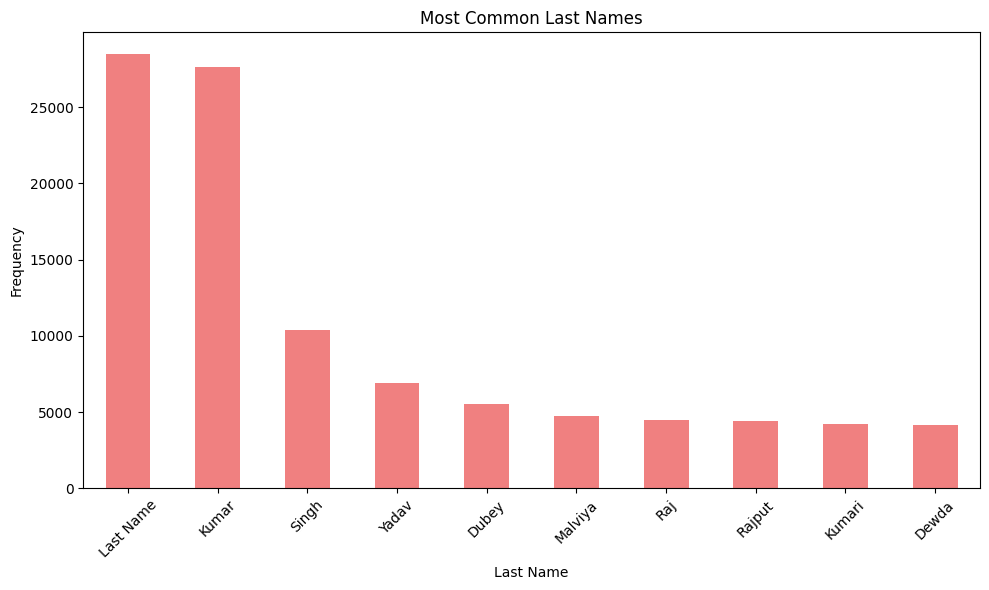

Most Common Last Names and Corresponding First Names:
Last Name: Last Name, First Names: First Name
Last Name: Kumar, First Names: Ayush, Byagari, Himanshu, Amit, Prem, Priyadarshi, Rajiv, Shubham, Mani, Ankit, Aakash, Abhishek, Challa Trivedh, Deepak, Sahil, Sandeep, Anoop, Ajay, Pradeep, Rajesh, Chandan, Gaurav, Rishaub, Ramesh, Anmol, Sajan, Anshu, Ramendra, Avinash, Rohit, Ajeet, Ritik, Shashank, Nagmani, Rahul, Manu, Shivam, Ashutosh, Vishal, Raushan, Sunny, Vinay, Arun, Sauhard, Vivek, Prabhat, Kiran, Sudhir, Akash, Vijay, Saurabh, Lalit, Neetesh, Satendra, Nirmal, Vikash, Neeraj, Puneet, Satyam, Utkarsh, Nandan, Suyash, Sandip, Aman, Sachin, Vinod, Sonu, Jitendra, Kishan, Raj, Gulshan, Sumit, Aditya, Pawan, Vickey, Durgesh, Ashish, Nitin, Sanoj, Prashant, Amar, Inderdev, Suneet, Dipendra, Srikant, Pratyush, Shailendra, Shailesh, Navdeep, Devender, Alkesh, Pratik, Sharad, Pankaj, Aashish, Mukund, Amrish, Avnish, Abhinesh, Uday, Sant, Tanish, Abhimanyu, Saurav, Ritesh, Nand, Alpes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_all is your DataFrame and contains 'First Name' and 'Last Name' columns

# Count the occurrences of each last name
most_common_last_names = df_all['Last Name'].value_counts().head(10)

# Plot the most common last names
plt.figure(figsize=(10,6))
most_common_last_names.plot(kind='bar', color='lightcoral')
plt.title('Most Common Last Names')
plt.xlabel('Last Name')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print the top 10 most common last names along with corresponding first names
print("Most Common Last Names and Corresponding First Names:")
for last_name in most_common_last_names.index:
    # Find all first names with the current last name
    first_names = df_all[df_all['Last Name'] == last_name]['First Name'].unique()
    
    print(f"Last Name: {last_name}, First Names: {', '.join(first_names)}")


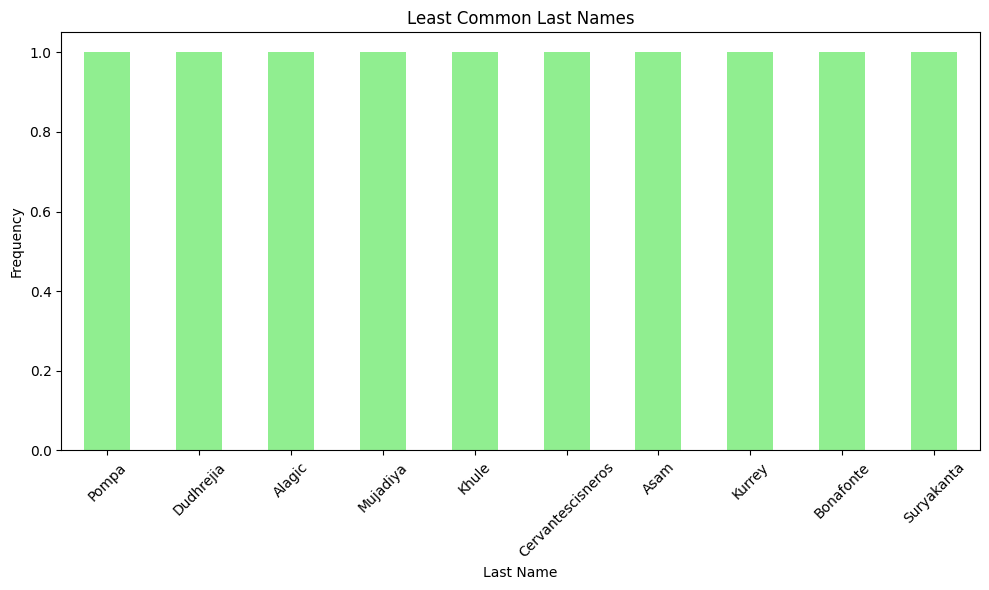

Least Common Last Names and Corresponding First Names:
Last Name: Pompa, First Names: Guerino
Last Name: Dudhrejia, First Names: Umesh
Last Name: Alagic, First Names: Anel
Last Name: Mujadiya, First Names: Nayyan
Last Name: Khule, First Names: Vaishnavi
Last Name: Cervantescisneros, First Names: Daniella
Last Name: Asam, First Names: Prathyusha
Last Name: Kurrey, First Names: Linkan
Last Name: Bonafonte, First Names: Antonio
Last Name: Suryakanta, First Names: Krishnalal

Number of occurrences for each least common last name:
Last Name
Pompa                1
Dudhrejia            1
Alagic               1
Mujadiya             1
Khule                1
Cervantescisneros    1
Asam                 1
Kurrey               1
Bonafonte            1
Suryakanta           1
Name: count, dtype: int64


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_all is your DataFrame and contains 'First Name' and 'Last Name' columns

# Find the least common last names (bottom 10)
least_common_last_names = df_all['Last Name'].value_counts().tail(10)

# Plot the least common last names
plt.figure(figsize=(10,6))
least_common_last_names.plot(kind='bar', color='lightgreen')
plt.title('Least Common Last Names')
plt.xlabel('Last Name')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print the least common last names along with corresponding first names
print("Least Common Last Names and Corresponding First Names:")
for last_name in least_common_last_names.index:
    first_names = df_all[df_all['Last Name'] == last_name]['First Name'].unique()
    print(f"Last Name: {last_name}, First Names: {', '.join(first_names)}")

# Print the number of occurrences of each least common last name
print("\nNumber of occurrences for each least common last name:")
print(least_common_last_names)
